# Prepocessing and data selection 

In [1]:
from GG_mthesis import *
%matplotlib inline

In [2]:
sns.set_style('whitegrid')
sns.set_palette('colorblind')
sns.set(font_scale=1.2)

## Reshaping

In [3]:
#define the path
path = '.\\data\\01_raw\\tsg_orchestra\\b1903933.nc'

#open the dataset with the defined path
ds_orig = xr.open_dataset(path) 

#Squeeze eliminates dimensions of length 0 and 1. Drop REFMAX as it is not needed. Swap MAXT (count) with TIME 
#to make TIME unique dimension (MAXT is a count a not needed, you can access the same with .isel). Rename coords to
#my standard.
ds = ds_orig.squeeze().drop_dims('REFMAX').swap_dims({'MAXT':'TIME'}).rename({
    'LONGITUDE':'lon','LATITUDE':'lat','TIME':'time','DEPTH':'depth'})

#Definition of new time attributes (datetime). Retrieved from original dataset and modified.
new_time_attr = {'long_name': 'Chronological DateTime Date',
 'standard_name': 'time',
 'ancillary_variables': 'TIME_SEADATANET_QC',
 'axis': 'T',
 'valid_min': 0.0,
 'valid_max': 2500000.0,
 'sdn_parameter_urn': 'SDN:P01::CJDY1101',
 'sdn_parameter_name': 'DateTime (chronological)',
 'sdn_uom_name': 'Days',
 'sdn_uom_urn': 'SDN:P06::UTAA'}

#Pull out the index (a CFTimeIndex) and use built in to_datetimeindex method.
datetimeindex = ds.indexes['time'].to_datetimeindex()

#Replace CFTimeIndex with DateTimeIndex:
ds['time'] = datetimeindex

#Attach new attributes
ds['time'].attrs = new_time_attr

ipykernel_launcher:26: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'julian', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.


## Quality control and name standards

Method: I apply the count_flags function to the QC variables. If they are fine (only good values and interpolated values) drop
it from the dataset (the QC variable).

In [4]:
#Here I create a dataframe of each flag occurence for each variable. 
#Call the count_flags function for each QC variable.
position_QC = data.QC.count_flags(ds.POSITION_SEADATANET_QC)
depth_QC = data.QC.count_flags(ds.DEPTH_SEADATANET_QC)
time_QC = data.QC.count_flags(ds.TIME_SEADATANET_QC)
attenuation_QC = data.QC.count_flags(ds.ATTNDR01_SEADATANET_QC)
conduc_QC = data.QC.count_flags(ds.CNDCSG01_SEADATANET_QC)
cloro_QC = data.QC.count_flags(ds.CPHLUMTF_SEADATANET_QC)
PS_uncal_QC = data.QC.count_flags(ds.PSALSG01_SEADATANET_QC)
PS_cal_QC = data.QC.count_flags(ds.PSALSU01_SEADATANET_QC)
T_hull1_QC = data.QC.count_flags(ds.TEMPHU01_SEADATANET_QC)
T_hull2_QC = data.QC.count_flags(ds.TEMPHU02_SEADATANET_QC)
T_cond_QC = data.QC.count_flags(ds.TMESSG01_SEADATANET_QC)

#create an index
index = ['position_QC', 'depth_QC', 'time_QC', 'attenuation_QC', 'conduc_QC', 'cloro_QC', 'PS_uncal_QC', 'PS_cal_QC', 
         'T_hull1_QC', 'T_hull2_QC', 'T_cond_QC']

#Create a list with each QC variable count
QC =[position_QC, depth_QC, time_QC, attenuation_QC, conduc_QC, cloro_QC, PS_uncal_QC, PS_cal_QC, T_hull1_QC, 
    T_hull2_QC, T_cond_QC]

#Create the dataframe
QC_df = pd.DataFrame(QC, index=index)

In [5]:
QC_df

,no_quality_control,good_value,probably_good_value,probably_bad_value,bad_value,changed_value,value_below_detection,value_in_excess,interpolated_value,missing_value,value_phenomenon_uncertain
position_QC,0,41189,0,0,0,0,0,0,88,0,0
depth_QC,0,41277,0,0,0,0,0,0,0,0,0
time_QC,0,41277,0,0,0,0,0,0,0,0,0
attenuation_QC,0,25051,0,174,0,0,0,0,0,0,0
conduc_QC,0,29854,0,9838,0,0,0,0,0,0,0
cloro_QC,0,25218,0,7,0,0,0,0,0,0,0
PS_uncal_QC,0,25380,0,9,0,0,0,0,0,0,0
PS_cal_QC,0,25221,0,8,0,0,0,0,0,0,0
T_hull1_QC,0,25220,0,4,0,0,0,0,0,0,0
T_hull2_QC,0,25220,0,4,0,0,0,0,0,0,0


It can be seen that the problematic variable is the conductivity, and a few temperature and salinity values. Let's map them and
have a look where they are located. If they are out region of interest they are going to be thrown out anyways.

In [6]:
ds

<xarray.Dataset>
Dimensions:                 (time: 41277)
Coordinates:
    lat                     (time) float64 ...
    lon                     (time) float64 ...
    depth                   (time) float32 ...
  * time                    (time) datetime64[ns] 2017-11-08 ... 2017-12-06T15:55:59.998528
Data variables:
    SDN_CRUISE              |S80 ...
    crs                     int32 ...
    SDN_EDMO_CODE           int32 ...
    SDN_STATION             |S80 ...
    SDN_LOCAL_CDI_ID        |S80 ...
    SDN_BOT_DEPTH           (time) float32 ...
    POSITION_SEADATANET_QC  (time) float32 49.0 49.0 49.0 ... 49.0 49.0 49.0
    DEPTH_SEADATANET_QC     (time) float32 49.0 49.0 49.0 ... 49.0 49.0 49.0
    TIME_SEADATANET_QC      (time) float32 49.0 49.0 49.0 ... 49.0 49.0 49.0
    ATTNDR01_SEADATANET_QC  (time) float32 nan nan nan nan ... nan nan nan nan
    ATTNDR01                (time) float32 ...
    CNDCSG01_SEADATANET_QC  (time) float32 nan nan nan nan ... nan nan nan nan
    CNDCSG01                (time) float32 ...
    CPHLUMTF_SEADATANET_QC  (time) float32 nan nan nan nan ... nan nan nan nan
    CPHLUMTF                (time) float32 ...
    PSALSG01_SEADATANET_QC  (time) float32 nan nan nan nan ... nan nan nan nan
    PSALSG01                (time) float32 ...
    PSALSU01_SEADATANET_QC  (time) float32 nan nan nan nan ... nan nan nan nan
    PSALSU01                (time) float32 ...
    TEMPHU01_SEADATANET_QC  (time) float32 nan nan nan nan ... nan nan nan nan
    TEMPHU01                (time) float32 ...
    TEMPHU02_SEADATANET_QC  (time) float32 nan nan nan nan ... nan nan nan nan
    TEMPHU02                (time) float32 ...
    TMESSG01_SEADATANET_QC  (time) float32 nan nan nan nan ... nan nan nan nan
    TMESSG01                (time) float32 ...
Attributes:
    date_update:  2020-07-31T01:05:54+0100
    comment:      
    Conventions:  SeaDataNet_1.0 CF-1.6
    featureType:  trajectory
    title:        SeaDataNet NETCDF TRAJECTORY Climate Forecast 1.6 - GENERAT...

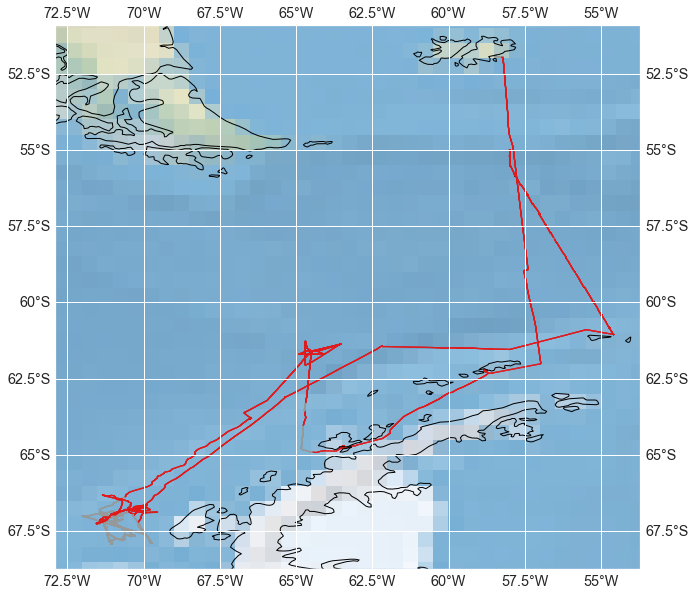

In [7]:
data.QC.cruise_map_QC(ds.CNDCSG01_SEADATANET_QC,
    ds.lon, 
    ds.lat,
    #savepath='C:\\Users\\gian_\\repos\\mthesis_gianlucca\\results\\preprocessing\\map_bad_values.png'
    ) 

The probably bad conductivity values are out of our region of interest. They are going to be disregarded anyways.

In [8]:
#data.QC.cruise_map_QC(ds.PSALSG01_SEADATANET_QC, ds.lon, ds.lat)

Same for the salinity, the bad values are not in out region of interest.

In [9]:
#data.QC.cruise_map_QC(ds.TEMPHU02_SEADATANET_QC, ds.lon, ds.lat)

Same for temperature

This means that we can drop all of the QC variables to reduce our dataset and make it more visual. They have been controlled, and in my region of interest there are not any conflicting values.

In [10]:
list(ds.variables)

['SDN_CRUISE',
 'crs',
 'SDN_EDMO_CODE',
 'SDN_STATION',
 'SDN_LOCAL_CDI_ID',
 'SDN_BOT_DEPTH',
 'lat',
 'lon',
 'POSITION_SEADATANET_QC',
 'depth',
 'DEPTH_SEADATANET_QC',
 'time',
 'TIME_SEADATANET_QC',
 'ATTNDR01_SEADATANET_QC',
 'ATTNDR01',
 'CNDCSG01_SEADATANET_QC',
 'CNDCSG01',
 'CPHLUMTF_SEADATANET_QC',
 'CPHLUMTF',
 'PSALSG01_SEADATANET_QC',
 'PSALSG01',
 'PSALSU01_SEADATANET_QC',
 'PSALSU01',
 'TEMPHU01_SEADATANET_QC',
 'TEMPHU01',
 'TEMPHU02_SEADATANET_QC',
 'TEMPHU02',
 'TMESSG01_SEADATANET_QC',
 'TMESSG01']

In [11]:
#Drop unnecessary variables to make dataset clearer. (Drop QC variables only if they are all good)

ds = ds.drop(['SDN_CRUISE','crs','SDN_EDMO_CODE','SDN_STATION','SDN_LOCAL_CDI_ID','SDN_BOT_DEPTH','POSITION_SEADATANET_QC',
              'DEPTH_SEADATANET_QC','TIME_SEADATANET_QC','ATTNDR01_SEADATANET_QC','CNDCSG01_SEADATANET_QC',
              'CPHLUMTF_SEADATANET_QC','PSALSG01_SEADATANET_QC','PSALSU01_SEADATANET_QC','TEMPHU01_SEADATANET_QC',
              'TEMPHU02_SEADATANET_QC','TMESSG01_SEADATANET_QC'])

#depth could theroetically also be dropped as it is constant, but it is not a big burden to stay and could be nice for future
#workflows.

#I also rename the variables to more mnemonic variable names (standarised names for this workflow)

In [12]:
ds = ds.rename({'ATTNDR01':'attenuation','CNDCSG01':'conductivity_tsg','CPHLUMTF':'chl-a','PSALSG01':'sal_tsg_cal',
                'PSALSU01':'sal_tsg_nocal', 'TEMPHU01':'temp_hull_1', 'TEMPHU02':'temp_hull_2', 'TMESSG01':'temp_cond_tsg'})

## Data (transect) selection

I am interested in the transect (or transects!) across the Drake passage

First I am going to plot the entire cruise data to the where it went along.

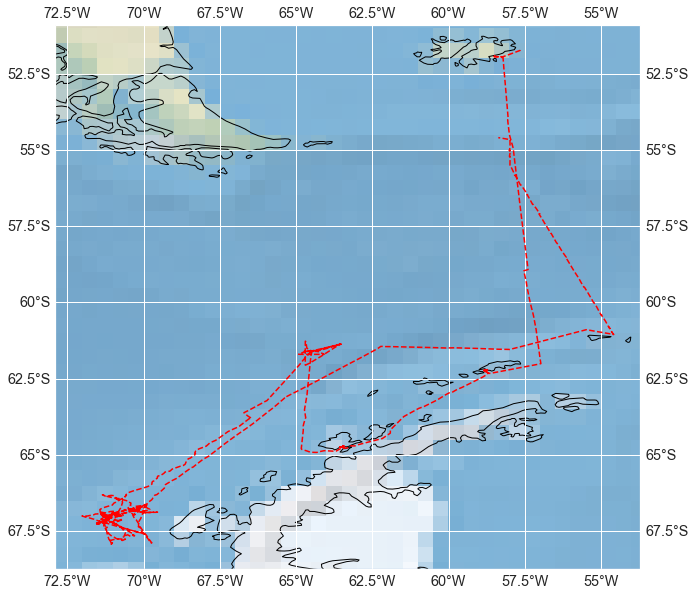

In [13]:
data.data_sel.cruise_map(ds.lon,
    ds.lat, 
    # savepath='C:\\Users\\gian_\\repos\\mthesis_gianlucca\\results\\preprocessing\\cruise_path.png'
    )

The next function give let's you select the data by geographical coordinates and time.

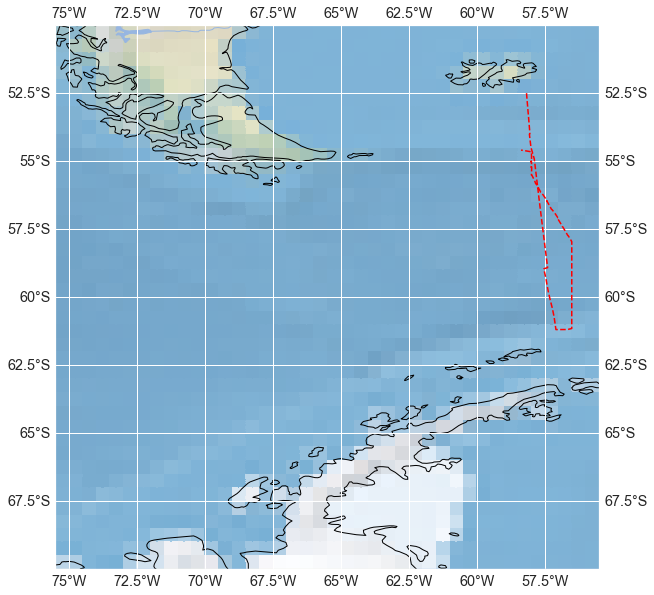

In [14]:
#I make a map with the geographical part of the cruise that I am interested in.
ds_select1_geo = data.data_sel.select_transect(ds,-58.5, -56.5, -61.2,-52.5)
data.data_sel.cruise_map(ds_select1_geo.lon,ds_select1_geo.lat,extent=[-75.5,-55.5,-70.0,-50.0],savepath='C:\\Users\\gian_\\repos\\mthesis_gianlucca\\results\\preprocessing\\geo_select_path.png')

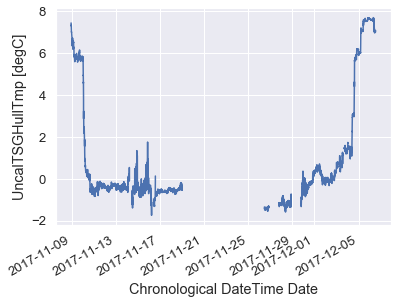

In [15]:
#To select the proper time period I have a look at the temperture data in a timeseries plot.
ds.temp_hull_1.plot()

I am only interested in this first crossing of the Drake passage between the 9th and the 13th aprox.

In [16]:
ds_select = data.data_sel.select_transect(ds,-58.5, -56.5, -61.2,-52.5, '2017-11-08', '2017-11-15')

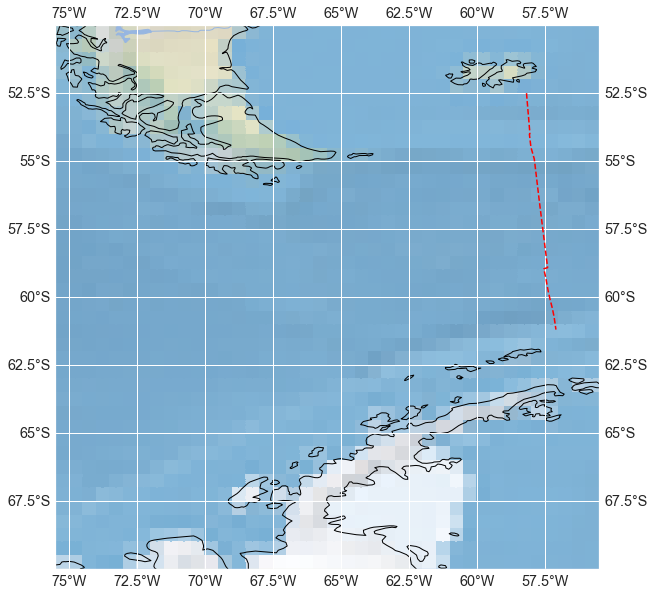

In [17]:
data.data_sel.cruise_map(ds_select.lon, ds_select.lat,extent=[-75.5,-55.5,-70.0,-50.0],savepath='C:\\Users\\gian_\\repos\\mthesis_gianlucca\\results\\preprocessing\\cruise_select_path.png')

In [18]:
ds = ds_select

## Dealing with missing values (NaN)

In [19]:
ds

<xarray.Dataset>
Dimensions:           (time: 2726)
Coordinates:
    lat               (time) float64 -52.5 -52.5 -52.51 ... -61.19 -61.19 -61.2
    lon               (time) float64 -58.17 -58.17 -58.17 ... -57.09 -57.09
    depth             (time) float32 6.5 6.5 6.5 6.5 6.5 ... 6.5 6.5 6.5 6.5 6.5
  * time              (time) datetime64[ns] 2017-11-09T02:12:59.999680 ... 2017-11-10T23:37:59.997824
Data variables:
    attenuation       (time) float32 0.3768252 0.35738423 ... 0.37621197
    conductivity_tsg  (time) float32 3.44636 3.446025 ... 2.85068 2.85017
    chl-a             (time) float32 3.82668 3.51624 3.44292 ... 1.41336 1.4157
    sal_tsg_cal       (time) float32 33.695 33.69425 33.69085 ... 33.934 33.9305
    sal_tsg_nocal     (time) float32 33.6981 33.69735 ... 33.9371 33.9336
    temp_hull_1       (time) float32 6.70895 6.69845 ... -0.55975 -0.5741
    temp_hull_2       (time) float32 6.72655 6.7223 6.72065 ... -0.5524 -0.5659
    temp_cond_tsg     (time) float32 7.4051 7.40175 7.41585 ... 0.3236 0.3199
Attributes:
    date_update:  2020-07-31T01:05:54+0100
    comment:      
    Conventions:  SeaDataNet_1.0 CF-1.6
    featureType:  trajectory
    title:        SeaDataNet NETCDF TRAJECTORY Climate Forecast 1.6 - GENERAT...

In [20]:
ds.temp_hull_1.isnull().sum()

<xarray.DataArray 'temp_hull_1' ()>
array(0)

In [21]:
cond_tsg_nan = int(ds.conductivity_tsg.isnull().sum())
sal_tsg_cal_nan = int(ds.sal_tsg_cal.isnull().sum())
sal_tsg_nocal_nan = int(ds.sal_tsg_nocal.isnull().sum())
temp_hull_1_nan = int(ds.temp_hull_1.isnull().sum())
temp_hull_2_nan = int(ds.temp_hull_2.isnull().sum())
temp_cond_tsg_nan = int(ds.temp_cond_tsg.isnull().sum())

ds_nan_dict = {'cond_tsg_nan':cond_tsg_nan, 'sal_tsg_cal_nan':sal_tsg_cal_nan, 'sal_tsg_nocal_nan':sal_tsg_nocal_nan, 
               'temp_hull_1_nan':temp_hull_1_nan, 'temp_hull_2_nan':temp_hull_2_nan, 'temp_cond_tsg_nan':temp_cond_tsg_nan}

ds_nan_values = list(ds_nan_dict.values())

index = list(ds_nan_dict.keys())

In [22]:
pd.DataFrame(ds_nan_values,index=index,columns=['Number of NaN values'])

,Number of NaN values
cond_tsg_nan,0
sal_tsg_cal_nan,0
sal_tsg_nocal_nan,0
temp_hull_1_nan,0
temp_hull_2_nan,0
temp_cond_tsg_nan,0


There are no missing values in the transect, so no further steps are required. If there were any plot a histogram of number of missing variables. Locate the missing values with a map (point map of coordinates with cmap coloring nan values). Decide what to do with the missing values (interpolate, delete, etc.)

The data stored in the dataset now is preprocessed and be used for first analyses. The next processing goal is gridding the data to a equally spaced transect. For that the spatial (and temporal) resolution has to be looked into first.

## Spatial resolution and excluding of some data (from fun_with_boat_speed.ipynb)

Here we are going to have a look into the distances between datapoints. This way we can exclude clustered up points (when the boat was moving slowly or standing still) or far away points (boat was moving really fast). Similar procedure as Drushka et al. (2019)

In [23]:
#Let's calculate the distances
distance = []
for coord in range(len(ds.lat)-1):
    distance.append(utils.geo.getPathLength(ds.lat[coord],ds.lon[coord],ds.lat[coord+1],ds.lon[coord+1]))
distance = np.array(distance)

#And the cumulative distance
distance_cum = np.insert(np.cumsum(distance), 0, 0)

ds['distance_cum'] = xr.DataArray(distance_cum,dims={'time':ds.time},coords={'time':ds.time})

[Text(0, 0.5, 'Distance travelled'), Text(0.5, 0, 'Time')]

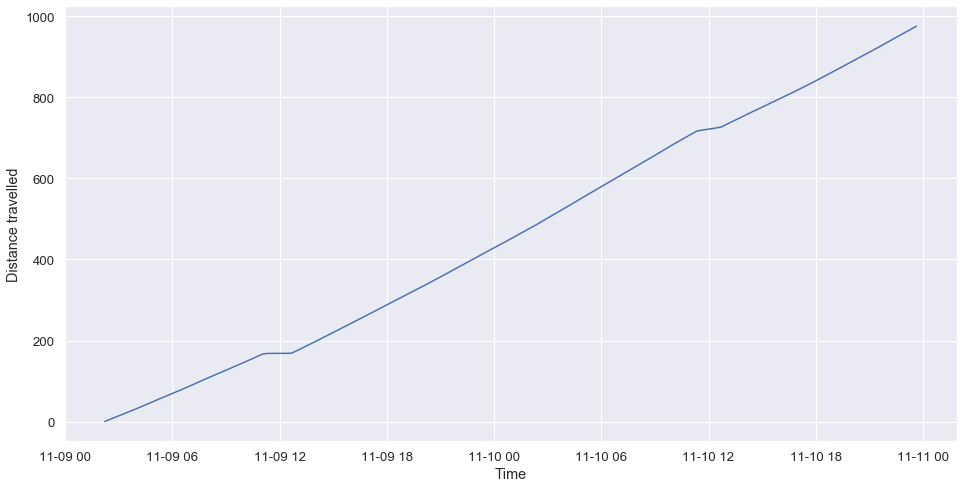

In [24]:
#Let's have a look at the plot distance - time plot

fig, ax0 = plt.subplots(figsize=(16,8))
sns.lineplot(y=ds.distance_cum/1000, x=ds.time)

ax0.set(xlabel='Time', ylabel='Distance travelled')

In [25]:
#Let's calculate each timestep (which should be 1 min)
time_diff = []
for time in range(len(ds.time)-1):
    time_diff.append(np.array((ds.time[time+1]) - np.array(ds.time[time]))/np.timedelta64(1, 's'))
time_diff = xr.DataArray(time_diff,dims={'distance':distance},coords={'distance':distance})

#Now we can calculate the vessel speed
vel = time_diff.distance/time_diff*3.6

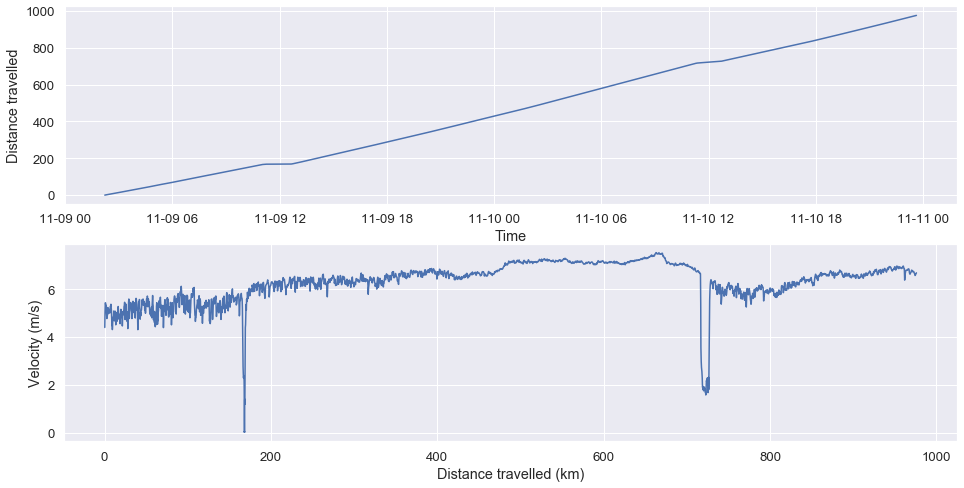

In [26]:
#Let's plot what we have got so far

fig, (ax0, ax1) = plt.subplots(nrows=2,figsize=(16,8))
sns.lineplot(y=ds.distance_cum/1000, x=ds.time, ax=ax0)

sns.lineplot(x=distance_cum[1:]/1000,y=vel/3.6, ax=ax1)

ax0.set(xlabel='Time', ylabel='Distance travelled')
ax1.set(xlabel='Distance travelled (km)', ylabel='Velocity (m/s)')

plt.savefig('C:\\Users\\gian_\\repos\\mthesis_gianlucca\\results\\preprocessing\\vessel_speed.png', bbox_inches='tight', format='png')

We can see two major stops off the vessel. 

In [27]:
#I am going to exclude all the data where the distance is less than 240 m (explanation in fun_with_boat_speed notebook).
#Let's calculate the cumulative distance between sampling points (starting at 0) and introduce it as a coordinate variable in the dataset

In [28]:
#just different method of calculatig the distances. Gonna leave them both for interest.
distance = gsw.distance(np.array(ds.lon), np.array(ds.lat))
distance_cum = np.insert(np.cumsum(distance), 0, 0)
ds['distance_cum'] = xr.DataArray(distance_cum,dims={'time':ds.time},coords={'time':ds.time})
ds = ds.set_coords('distance_cum')
ds['distance_cum'].attrs = {
    'long_name': 'Cumulative distance',
    'standard_name': 'distance_cum',
    'units': 'm',
    'description': 'cumulative distance between sampling points calculated using gsw'
}

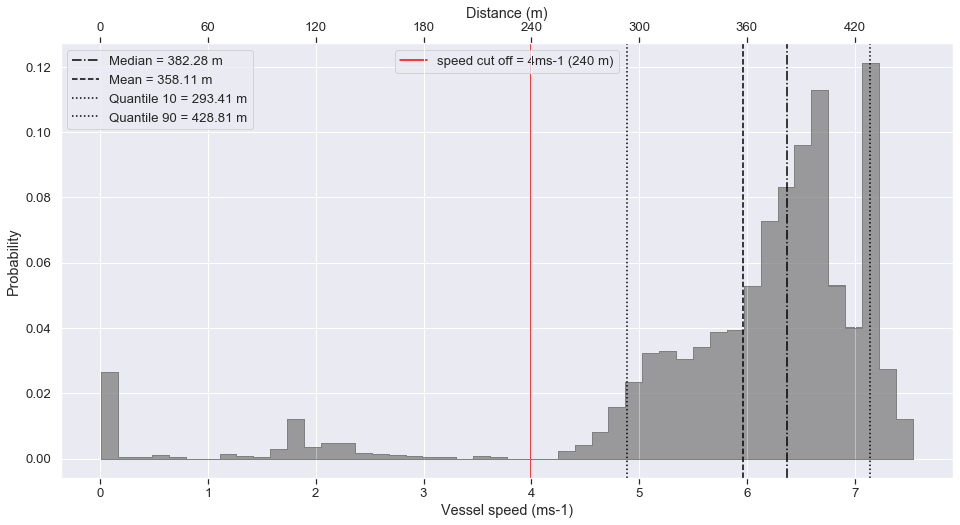

In [29]:
#Let's plot the distances and vessel speed in a histogram, with a cut-off line at 4ms-1

fig, ax0 = plt.subplots(nrows=1, ncols=1, sharex=True, figsize=(16,8))
ax1 = ax0.twiny()

sns.histplot(vel/3.6, element='step', stat='probability', color='grey', alpha = 0.5, ax=ax0)
sns.histplot(distance, element='step', stat='probability', color='grey', alpha =0.5, ax=ax1)

ax1.axvline(x=np.median(distance), label=str(('Median = ') + str(round(np.median(distance),2)) 
    + str(' m')), color='black', linestyle='-.')
ax1.axvline(x=np.mean(distance), label=str(('Mean = ') + str(round(np.mean(distance),2)) 
    + str(' m')), color='black', linestyle='--')
ax1.axvline(x=np.quantile(distance, .10), label=str(('Quantile 10 = ') + str(round(np.quantile(distance, .10),2)) 
    + str(' m')), color='black', linestyle=':',)
ax1.axvline(x=np.quantile(distance, .90), label=str(('Quantile 90 = ') + str(round(np.quantile(distance, .90),2)) 
    + str(' m')), color='black', linestyle=':')
ax1.legend(loc='upper left')

ax0.axvline(x=4, label='speed cut off = 4ms-1 (240 m)', color='red', linestyle='-')

ax1.set_xticks(np.arange(0, 460, 60))

ax0.set(xlabel='Vessel speed (ms-1)')
ax1.set(xlabel='Distance (m)')

ax0.legend(loc='upper center')

plt.savefig('C:\\Users\\gian_\\repos\\mthesis_gianlucca\\results\\preprocessing\\vessel_speed_hist.png', bbox_inches='tight', format='png')

In [30]:
ds_check = ds

In [31]:
#In order to select the appropiate data, we have to create a auxilary distance variable with the same len as all the variables (more in variable description).
distance_aux = np.insert(distance, 0, 999) #CAREFUL: if I was to introduce a Nan instead of 999 we would introduce a Nan value in all the variables.
ds['distance_aux'] = xr.DataArray(distance_aux,dims={'time':ds.time},coords={'time':ds.time})
ds['distance_aux'].attrs = {
    'long_name': 'Auxiliary distances',
    'standard_name': 'distance_aux',
    'units': 'm',
    'description': 'Auxiliary variable composed of the distances between datapoint with an additional point inserted as the first value, being 999. This is in order to be able to sample out of the dataset acording to the distance. That way, e.g., if one wanted to sample all values with a distance greater than 200m, the reaching point of each distance sample would be excluded.'
}

#Now we can select by this variable and drop all created NaNs:
ds = ds.where(ds.distance_aux >= 240).dropna('time')

#I have to recalculate the cumulative distances as well:
distance = gsw.distance(np.array(ds.lon), np.array(ds.lat))
distance_cum = np.insert(np.cumsum(distance), 0, 0)
ds['distance_cum'] = xr.DataArray(distance_cum,dims={'time':ds.time},coords={'time':ds.time})
ds = ds.set_coords('distance_cum')
ds['distance_cum'].attrs = {
    'long_name': 'Cumulative distance',
    'standard_name': 'distance_cum',
    'units': 'm',
    'description': 'cumulative distance between sampling points calculated using gsw'
}

#Now we can drop the auxiliary distance variable again.
ds = ds.drop('distance_aux')

## Density calculation

In [32]:
#I am going to work with temperature (and we have decided to use the TSG temperature) and salinity (calibrated). I am going to drop of the variables I do not need. I also rename salinity and temperature.
#POT_TEMP --> LOOK AT WORKING NOTES
ds = ds.drop(['attenuation','conductivity_tsg','chl-a','sal_tsg_nocal','temp_hull_1','temp_hull_2']).rename({'sal_tsg_cal':'SP', 'temp_cond_tsg':'T'})

In [33]:
#I am going to check the influence of pressure on the data:
#Let's obtain the pressure, absolute salinity and conservative temperature. (As the water is pumped on-board the pressure is released)
ds['pressure'] = gsw.p_from_z(-ds.depth, ds.lat)
ds['SA'] = gsw.SA_from_SP(ds.SP, 0, ds.lon, ds.lat)
ds['CT'] = gsw.CT_from_t(ds.SA, ds.T, 0)

#Attributes for the variable
ds['pressure'].attrs = {
    'long_name': 'Pressure',
    'standard_name': 'press',
    'units': 'dbar',
    'description': 'Sea pressure from height using gsw.'}

ds['SA'].attrs = {
    'long_name': 'Absolute Salinity',
    'standard_name': 'CT',
    'units': 'g/kg',
    'description': 'Absolute salinity from practical salinity using gsw.'}

ds['CT'].attrs = {
    'long_name': 'Conservative Temperture',
    'standard_name': 'CT',
    'units': '°C',
    'description': 'Conservative temperature from potential temperature using gsw.'}

In [34]:
#Going to check something out. The operating pressure is 34.5 dbar max, let's say 30dbar. That means an approximate depth of 30m. Let's calculate the CT with this depth. 

In [35]:
CT_30 = gsw.CT_from_t(ds.SA, ds.T, 30)

[Text(0, 0.5, 'Temperature difference (°C)'),
 Text(0.5, 0, 'Distance travelled (km)')]

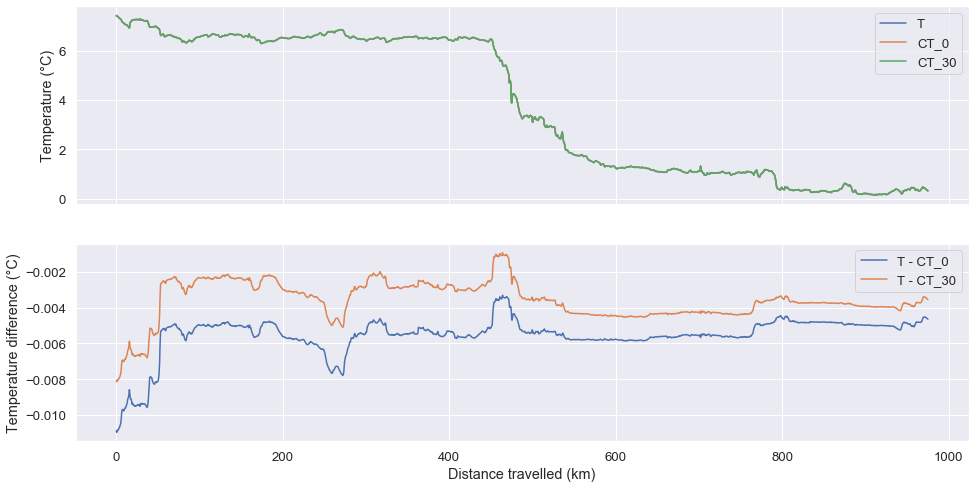

In [36]:
fig, (ax0, ax1) = plt.subplots(nrows=2, ncols=1, figsize=(16,8), sharex=True)

sns.lineplot(x=ds.distance_cum/1000, y=ds.T, label='T', ax=ax0)
sns.lineplot(x=ds.distance_cum/1000, y=ds.CT, label='CT_0', ax=ax0)
sns.lineplot(x=ds.distance_cum/1000, y=CT_30, label='CT_30', ax=ax0)

sns.lineplot(x=ds.distance_cum/1000, y=ds.T-ds.CT, label='T - CT_0', ax=ax1)
sns.lineplot(x=ds.distance_cum/1000, y=ds.T-CT_30, label='T - CT_30', ax=ax1)

ax0.legend()
ax0.set(xlabel='Distance travelled (km)', ylabel='Temperature (°C)')
ax1.set(xlabel='Distance travelled (km)', ylabel='Temperature difference (°C)')

In [37]:
#From here we can calculate the density. As the water is pumped to the surface it is moved adiabatically, so it actually is the the potential temperature
#Because the differences in conservative temperature of the pressure build of inside of the system is low, for now I will consider a zero depth.
ds['rho_pot'] = gsw.rho(ds.SA, ds.CT, 0)

ds['rho_pot'].attrs = {
    'long_name': 'Potential density',
    'standard_name': 'rho_pot',
    'units': 'kg m-3',
    'description': 'Potential density calculated from SA and CT at 0 pressure using gsw.'}

In [38]:
ds

<xarray.Dataset>
Dimensions:       (time: 2545)
Coordinates:
    lat           (time) float64 -52.5 -52.5 -52.51 ... -61.19 -61.19 -61.2
    lon           (time) float64 -58.17 -58.17 -58.17 ... -57.09 -57.09 -57.09
    depth         (time) float32 6.5 6.5 6.5 6.5 6.5 6.5 ... 6.5 6.5 6.5 6.5 6.5
  * time          (time) datetime64[ns] 2017-11-09T02:12:59.999680 ... 2017-11-10T23:37:59.997824
    distance_cum  (time) float64 0.0 264.2 567.0 ... 9.746e+05 9.75e+05
Data variables:
    SP            (time) float32 33.695 33.69425 33.69085 ... 33.934 33.9305
    T             (time) float32 7.4051 7.40175 7.41585 ... 0.3236 0.3199
    pressure      (time) float64 6.558 6.558 6.558 6.558 ... 6.563 6.563 6.563
    SA            (time) float64 33.85 33.85 33.85 33.85 ... 34.1 34.1 34.09
    CT            (time) float64 7.416 7.413 7.427 7.408 ... 0.337 0.3282 0.3245
    rho_pot       (time) float64 1.026e+03 1.026e+03 ... 1.027e+03 1.027e+03
Attributes:
    date_update:  2020-07-31T01:05:54+0100
    comment:      
    Conventions:  SeaDataNet_1.0 CF-1.6
    featureType:  trajectory
    title:        SeaDataNet NETCDF TRAJECTORY Climate Forecast 1.6 - GENERAT...

In [39]:
#This dataset has been reshaped, selected, QC and SA, CT and density has been calculated. It now can be saved as the preprocessing step.
#The next processing step is going to be gridding the data.
path_to = '.\\data\\02_intermediate\\tsg_orchestra\\b1903933_preprocessed.nc'
ds.to_netcdf(path_to)